In [1]:
import sqlite3
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy as sp
from scipy import stats 
from math import ceil
from datetime import datetime
from sklearn.impute import KNNImputer
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler, StandardScaler, OneHotEncoder
from pandas_profiling import ProfileReport

# for better resolution plots
%config InlineBackend.figure_format = 'retina' # optionally, you can change 'svg' to 'retina'

sns.set()


# Reading the Data

In [2]:
donors = pd.read_csv('donors.csv', low_memory=False)
donors = donors.set_index('Unnamed: 0')
donors.index.name = None


In [3]:
# donors.to_excel('donors.xlsx', index = False) 

# Initial Analysis

In [4]:
# profile = ProfileReport(donors.sample(n=10000), minimal=True)

# # saving the report as an output.html file

# profile.to_file("output.html")

In [5]:
donors.head() # dataset head

,ODATEDW,OSOURCE,TCODE,STATE,ZIP,MAILCODE,PVASTATE,DOB,NOEXCH,RECINHSE,...,AVGGIFT,CONTROLN,HPHONE_D,RFA_2R,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A,GEOCODE2
0,2009-01-01,GRI,0,IL,61081,,,1957-12-01,0,,...,7.741935,95515,0,L,4,E,X,X,X,C
1,2014-01-01,BOA,1,CA,91326,,,1972-02-01,0,,...,15.666667,148535,0,L,2,G,X,X,X,A
2,2010-01-01,AMH,1,NC,27017,,,NaN,0,,...,7.481481,15078,1,L,4,E,X,X,X,C
3,2007-01-01,BRY,0,CA,95953,,,1948-01-01,0,,...,6.812500,172556,1,L,4,E,X,X,X,C
4,2006-01-01,,0,FL,33176,,,1940-01-01,0,X,...,6.864865,7112,1,L,2,F,X,X,X,A


In [6]:
donors.isna().sum().sort_values(ascending = False) # count of missing values

RAMNT_5    95403
RDATE_5    95403
RAMNT_3    95170
RDATE_3    95170
RDATE_4    95131
           ...  
EIC11          0
EIC12          0
EIC13          0
EIC14          0
ODATEDW        0
Length: 475, dtype: int64

In [7]:
donors.duplicated().sum() # check if there are duplicated observations

0

In [8]:
donors.dtypes #  dataset data types

ODATEDW     object
OSOURCE     object
TCODE        int64
STATE       object
ZIP         object
             ...  
RFA_2A      object
MDMAUD_R    object
MDMAUD_F    object
MDMAUD_A    object
GEOCODE2    object
Length: 475, dtype: object

fixing the wrong data types

In [9]:
# Once 'TCODE', 'HPHONE_D' and 'RFA_2F' are categorical and not numerical we'll change the datatype

cols = ['TCODE', 'HPHONE_D', 'RFA_2F']
donors[cols] = donors[cols].astype('object')


In [10]:
donors[['TCODE', 'HPHONE_D', 'RFA_2F']].dtypes

TCODE       object
HPHONE_D    object
RFA_2F      object
dtype: object

In [11]:
donors.describe().T  # getting the main descriptive statistics

,count,mean,std,min,25%,50%,75%,max
NUMCHLD,12386.0,1.527773,0.806861,1.000000,1.000000,1.000000,2.000000,7.0
INCOME,74126.0,3.886248,1.854960,1.000000,2.000000,4.000000,5.000000,7.0
WEALTH1,50680.0,5.345699,2.742490,0.000000,3.000000,6.000000,8.000000,9.0
HIT,95412.0,3.321438,9.306899,0.000000,0.000000,0.000000,3.000000,241.0
MBCRAFT,42558.0,0.152075,0.470023,0.000000,0.000000,0.000000,0.000000,6.0
...,...,...,...,...,...,...,...,...
MAXRAMNT,95412.0,19.999790,25.067746,5.000000,14.000000,17.000000,23.000000,5000.0
LASTGIFT,95412.0,17.313127,13.956630,0.000000,10.000000,15.000000,20.000000,1000.0
TIMELAG,85439.0,8.093739,8.213242,0.000000,4.000000,6.000000,11.000000,1088.0
AVGGIFT,95412.0,13.347786,10.769997,1.285714,8.384615,11.636364,15.477955,1000.0


# Handle with variables of central tendency measures 

Once there are variables that provide the same information but in different measures, we decide to keep the variables that refer to the median because it's less sensitive to outliers and remove the others ones in these specific cases.

One example of the situation described above is the variable HHP1 (Median Person Per Household) and HHP2 (Average Person Per Household).


In [12]:
mean_colums = ['HHP2','HV2','HV4','RHP2','IC3','IC4','AGE904','AGE905','AGE906']
donors.drop(columns=mean_colums, inplace= True)


#  Handle with redundant variables

Since there are variables that have repeated information, that is, variables that englobe other variables, let's take into consideration, for example, HHN3 (Percent 3 or More Person Households) and HHN4 (Percent 4 or More Person Households).
We can soon conclude that HHN4 is mentioned in HHN3, once 'more than 3' englobe the percent of 4 and so on.

In these particular cases, we decide to keep the variables that provide the same meaning as the others of the same kind, without losing information, and discard the ones that are already indirectly specified in the ones that we chose to keep.

In [13]:
redundant_variables = ['HHN4','HHN5','HHN6','DW5','DW6','HVP1','HVP2','HVP3','HVP4','HVP6','RP1','RP2','RP3','CHIL1','CHIL2','CHIL3','CHILC1', 'CHILC2','CHILC4','CHILC5']
donors.drop(columns=redundant_variables, inplace= True)


# Missing Values

In [14]:
column_mv = donors.columns[donors.isnull().any()] # creating a variable that will contain the name of the columns that have missing values
column_mv = list(column_mv)

lst = []
for i in column_mv:
    perct = donors[i].isnull().sum()/len(donors[i])*100
    lst.append(perct)

lst

d_ms = dict(zip(column_mv, lst)) # percentage of missing values for each column that contains missing values

d_ms = dict(sorted(d_ms.items(), key=lambda x: x[1], reverse=True)) # to have the percentages in descending order
d_ms

{'RDATE_5': 99.99056722424852,
 'RAMNT_5': 99.99056722424852,
 'RDATE_3': 99.7463631409047,
 'RAMNT_3': 99.7463631409047,
 'RDATE_4': 99.70548777931498,
 'RAMNT_4': 99.70548777931498,
 'RDATE_6': 99.1866851129837,
 'RAMNT_6': 99.1866851129837,
 'RDATE_15': 92.38879805475202,
 'RAMNT_15': 92.38879805475202,
 'RDATE_23': 91.76309059657066,
 'RAMNT_23': 91.76309059657066,
 'RDATE_20': 91.73269609692701,
 'RAMNT_20': 91.73269609692701,
 'RDATE_7': 90.67727329895611,
 'RAMNT_7': 90.67727329895611,
 'RDATE_17': 90.14694168448413,
 'RAMNT_17': 90.14694168448413,
 'RDATE_21': 90.02955603068796,
 'RAMNT_21': 90.02955603068796,
 'RDATE_10': 89.03597031819896,
 'RAMNT_10': 89.03597031819896,
 'RDATE_13': 87.1609441160441,
 'RAMNT_13': 87.1609441160441,
 'NUMCHLD': 87.01840439357733,
 'RDATE_11': 84.55120949146858,
 'RAMNT_11': 84.55120949146858,
 'RDATE_19': 83.35953548819855,
 'RAMNT_19': 83.35953548819855,
 'RDATE_9': 82.46132561941894,
 'RAMNT_9': 82.46132561941894,
 'RDATE_24': 81.40904708003

In [15]:
d_50ms = dict((k, v) for k, v in d_ms.items() if v >= 50) # obtaining the columns that have at least 50% of missing values
d_50ms

{'RDATE_5': 99.99056722424852,
 'RAMNT_5': 99.99056722424852,
 'RDATE_3': 99.7463631409047,
 'RAMNT_3': 99.7463631409047,
 'RDATE_4': 99.70548777931498,
 'RAMNT_4': 99.70548777931498,
 'RDATE_6': 99.1866851129837,
 'RAMNT_6': 99.1866851129837,
 'RDATE_15': 92.38879805475202,
 'RAMNT_15': 92.38879805475202,
 'RDATE_23': 91.76309059657066,
 'RAMNT_23': 91.76309059657066,
 'RDATE_20': 91.73269609692701,
 'RAMNT_20': 91.73269609692701,
 'RDATE_7': 90.67727329895611,
 'RAMNT_7': 90.67727329895611,
 'RDATE_17': 90.14694168448413,
 'RAMNT_17': 90.14694168448413,
 'RDATE_21': 90.02955603068796,
 'RAMNT_21': 90.02955603068796,
 'RDATE_10': 89.03597031819896,
 'RAMNT_10': 89.03597031819896,
 'RDATE_13': 87.1609441160441,
 'RAMNT_13': 87.1609441160441,
 'NUMCHLD': 87.01840439357733,
 'RDATE_11': 84.55120949146858,
 'RAMNT_11': 84.55120949146858,
 'RDATE_19': 83.35953548819855,
 'RAMNT_19': 83.35953548819855,
 'RDATE_9': 82.46132561941894,
 'RAMNT_9': 82.46132561941894,
 'RDATE_24': 81.40904708003

## Removing the columns that have missing values

In [16]:
variables_names = d_50ms.keys() # getting the names of the variables to discard


In [17]:
# based on the % of missig values and the meaning of the variables, we decide to discard the following varibales :

donors.drop(columns=variables_names, inplace= True)


#  Low Variance

In [18]:
# https://stackoverflow.com/questions/61159209/normalize-data-before-removing-low-variance-makes-errors

In [19]:
# https://www.ttested.com/removing-zero-variance-columns/
# https://www.kdnuggets.com/2015/05/7-methods-data-dimensionality-reduction.html
# https://machinelearningmastery.com/basic-data-cleaning-for-machine-learning/

In [20]:
columns_var = list(donors.var()) # seeing the variance of each column

In [21]:
columns_names = list(donors.var().index)

def create_dict(keys, values): 
    return dict(zip(keys, values + [None] * (len(keys) - len(values))))

columns = create_dict(columns_names, columns_var) # creating a dictionary with the variance of each column
columns

{'TCODE': 909819.2840688606,
 'INCOME': 3.4408747513868603,
 'WEALTH1': 7.521248688277151,
 'HIT': 86.61836509030931,
 'MALEMILI': 25.65951618329298,
 'MALEVET': 131.57361154160955,
 'VIETVETS': 227.94210070072944,
 'WWIIVETS': 313.6109817376459,
 'LOCALGOV': 19.287020899400435,
 'STATEGOV': 26.282215284858786,
 'FEDGOV': 17.265422787235952,
 'WEALTH2': 7.855457007336339,
 'POP901': 32984544.567467954,
 'POP902': 2126065.625467013,
 'POP903': 4507537.651949014,
 'POP90C1': 2249.678298156833,
 'POP90C2': 974.8181415804087,
 'POP90C3': 1603.0297953968272,
 'POP90C4': 30.975673304468177,
 'POP90C5': 33.27398880335181,
 'ETH1': 441.58294362175894,
 'ETH2': 278.58183677000665,
 'ETH3': 12.036171788099843,
 'ETH4': 49.981497060642525,
 'ETH5': 190.05547899305813,
 'ETH6': 0.46141453565491125,
 'ETH7': 4.9825664775647,
 'ETH8': 6.419855930862941,
 'ETH9': 5.332427403861326,
 'ETH10': 1.0070716912318383,
 'ETH11': 1.1111710399372703,
 'ETH12': 1.3681312506128334,
 'ETH13': 128.44899975254043,


In [22]:
low_var = dict((k, v) for k, v in columns.items() if v < 1) # obtaining / getting the columns that have variance < 1
low_var   

{'ETH6': 0.46141453565491125,
 'TPE6': 0.5398683316909378,
 'TPE7': 0.48373672466246587,
 'OCC6': 0.9900397334120534,
 'ANC5': 0.5005661250581213,
 'ANC6': 0.2841849904612681,
 'ANC11': 0.7505513156811249,
 'ANC13': 0.9552719961070043,
 'ANC15': 0.15063354956767072,
 'HC15': 0.24366676568864604,
 'MHUC2': 0.7514615411535371,
 'HPHONE_D': 0.25000223785642706}

### Visualizing the correspondent columns

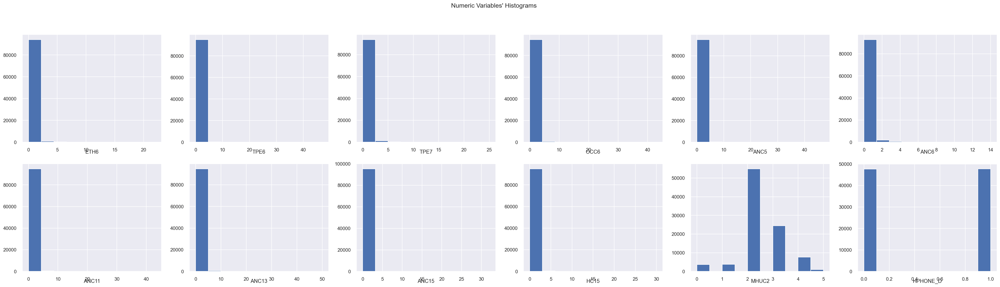

In [23]:
low_varnames = ['ETH6', 'TPE6', 'TPE7', 'OCC6', 'ANC5', 'ANC6', 'ANC11', 'ANC13', 'ANC15', 'HC15', 'MHUC2', 'HPHONE_D']
sns.set()

fig, axes = plt.subplots(2, ceil(len(low_varnames) / 2), figsize=(40, 10))
for ax, feat in zip(axes.flatten(), low_varnames): 
    ax.hist(donors[feat])
    ax.set_title(feat, y=-0.13)
    
title =  "Numeric Variables' Histograms"

plt.suptitle(title)

plt.show()

## Removing the Columns That Have A Low Variance

If the variance is too low, it means that it does not change much and hence it can be ignored. 

We will remove the columns that have variance nearly to zero

In [24]:
lowvar_todrop = low_var.keys() # getting the names of the variables to discard
lowvar_todrop

dict_keys(['ETH6', 'TPE6', 'TPE7', 'OCC6', 'ANC5', 'ANC6', 'ANC11', 'ANC13', 'ANC15', 'HC15', 'MHUC2', 'HPHONE_D'])

In [25]:
donors.drop(columns=lowvar_todrop, inplace= True)



# Single Value Columns

In [26]:
# get number of unique values for each column using numpy
counts = list(donors.nunique())
names = list(donors.nunique().index)

columns = create_dict(names, counts)

# record columns to delete
to_del = dict((k, v) for k, v in columns.items() if v == 1) 
to_del

 

{'ADATE_5': 1, 'RFA_2R': 1}

## Remove Columns That Contain a Single Value

In [27]:
variables_names3 = to_del.keys() # getting the names of the variables to discard
donors.drop(columns=variables_names3, inplace= True)
donors

,ODATEDW,OSOURCE,TCODE,STATE,ZIP,MAILCODE,PVASTATE,DOB,NOEXCH,RECINHSE,...,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A,GEOCODE2
0,2009-01-01,GRI,0,IL,61081,,,1957-12-01,0,,...,2010-03-01,4.0,7.741935,95515,4,E,X,X,X,C
1,2014-01-01,BOA,1,CA,91326,,,1972-02-01,0,,...,2015-04-01,18.0,15.666667,148535,2,G,X,X,X,A
2,2010-01-01,AMH,1,NC,27017,,,NaN,0,,...,2011-01-01,12.0,7.481481,15078,4,E,X,X,X,C
3,2007-01-01,BRY,0,CA,95953,,,1948-01-01,0,,...,2007-11-01,9.0,6.812500,172556,4,E,X,X,X,C
4,2006-01-01,,0,FL,33176,,,1940-01-01,0,X,...,2000-05-01,14.0,6.864865,7112,2,F,X,X,X,A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95407,2016-01-01,ASE,1,AK,99504,,,NaN,0,,...,NaN,NaN,25.000000,184568,1,G,X,X,X,C
95408,2016-01-01,DCD,1,TX,77379,,,1970-01-01,0,,...,NaN,NaN,20.000000,122706,1,F,X,X,X,A
95409,2015-01-01,MBC,1,MI,48910,,,1958-01-01,0,,...,2015-01-01,3.0,8.285714,189641,3,E,X,X,X,B
95410,2006-01-01,PRV,0,CA,91320,,,1960-05-01,0,X,...,2007-04-01,4.0,12.146341,4693,4,F,X,X,X,A


# Outliers

In [28]:
# https://www.analyticsvidhya.com/blog/2016/01/guide-data-exploration/
# https://analysights.wordpress.com/2010/09/15/correcting-for-outliers/
# https://medium.com/@saishruthi.tn/data-mining-introduction-data-preprocessing-5080be604f96
# https://towardsdatascience.com/data-pre-processing-techniques-you-should-know-8954662716d6
# # https://github.com/codebasics/py/blob/master/ML/FeatureEngineering/2_outliers_z_score/2_outliers_z_score.ipynb
# # https://hausetutorials.netlify.app/posts/2019-10-07-outlier-detection-with-median-absolute-deviation/

Defining metric and non-metric features


In [29]:
metric_features = donors.select_dtypes(include=np.number)
non_metric_features = donors.select_dtypes(exclude=np.number)

## Outlier detection

Here we get the columns that have outliers and the number of outliers of each column

In [30]:
# Quartile calculations:

Q1 = metric_features.quantile(0.25) # 1st quartile
Q3 = metric_features.quantile(0.75) # 3st quartile
IQR = Q3 - Q1 # #Interquartile range

In [31]:
# numbers of outliers for each column

outliers = ((metric_features < (Q1 - 1.5 * IQR)) | (metric_features > (Q3 + 1.5 * IQR))).sum()
number_outliers = list(outliers.sort_values(ascending=False))

In [32]:
create_dict(outliers.index, number_outliers)

{'INCOME': 22044,
 'WEALTH1': 21414,
 'HIT': 21346,
 'MALEMILI': 21236,
 'MALEVET': 20566,
 'VIETVETS': 20327,
 'WWIIVETS': 19481,
 'LOCALGOV': 19030,
 'STATEGOV': 18784,
 'FEDGOV': 17534,
 'WEALTH2': 17306,
 'POP901': 17156,
 'POP902': 17084,
 'POP903': 16563,
 'POP90C1': 15793,
 'POP90C2': 15146,
 'POP90C3': 14923,
 'POP90C4': 14682,
 'POP90C5': 13920,
 'ETH1': 13646,
 'ETH2': 13637,
 'ETH3': 13534,
 'ETH4': 13344,
 'ETH5': 13271,
 'ETH7': 13219,
 'ETH8': 12632,
 'ETH9': 12461,
 'ETH10': 12137,
 'ETH11': 11905,
 'ETH12': 11877,
 'ETH13': 11626,
 'ETH14': 11490,
 'ETH15': 11326,
 'ETH16': 11221,
 'AGE901': 11177,
 'AGE902': 11162,
 'AGE903': 10815,
 'AGE907': 10514,
 'AGEC1': 10307,
 'AGEC2': 10015,
 'AGEC3': 10001,
 'AGEC4': 9934,
 'AGEC5': 9927,
 'AGEC6': 9885,
 'AGEC7': 9460,
 'CHILC3': 9400,
 'HHAGE1': 9124,
 'HHAGE2': 8996,
 'HHAGE3': 8972,
 'HHN1': 8844,
 'HHN2': 8692,
 'HHN3': 8594,
 'MARR1': 8546,
 'MARR2': 8537,
 'MARR3': 8470,
 'MARR4': 8348,
 'HHP1': 8237,
 'DW1': 8181,
 'D

## Outlier removal using only the IQR method


In [33]:
def remove_outlier(df, col_name):
    q1 = df[col_name].quantile(0.25)
    q3 = df[col_name].quantile(0.75)
    iqr = q3-q1 
    lower_lim  = q1-2*iqr
    upper_lim = q3+2*iqr
    df_out = df.loc[(df[col_name] > lower_lim) & (df[col_name] < upper_lim)]
    return df_out

In [34]:
df_out = remove_outlier(donors, 'MARR1')
num_rows_removed = donors.shape[0] - df_out.shape[0]
num_rows_removed

1860

In [35]:
donors.shape[0]

95412

In [36]:
df_out.shape[0]

93552

In [37]:
print('Percentage of droped data after removing the outliers of HHN6:', 1 - np.round(df_out.shape[0] / donors.shape[0], 4))

Percentage of droped data after removing the outliers of HHN6: 0.019499999999999962


## Combining different outlier methods

More robust/ consistent outlier detection method:

### Outlier detection and removal using 3 standard deviation


### Use median absolute deviation to detect outliers

In [ ]:
# https://hausetutorials.netlify.app/posts/2019-10-07-outlier-detection-with-median-absolute-deviation/

### Z-Score

## Fill missing values (Data imputation)

In [28]:
list(donors.columns[donors.isnull().any()]) # columns that remain and still have missing values

['DOB',
 'INCOME',
 'WEALTH1',
 'WEALTH2',
 'MSA',
 'ADI',
 'DMA',
 'ADATE_3',
 'ADATE_4',
 'ADATE_6',
 'ADATE_7',
 'ADATE_8',
 'ADATE_9',
 'ADATE_10',
 'ADATE_11',
 'ADATE_12',
 'ADATE_13',
 'ADATE_14',
 'ADATE_16',
 'ADATE_17',
 'ADATE_18',
 'ADATE_19',
 'ADATE_21',
 'ADATE_22',
 'ADATE_24',
 'FISTDATE',
 'NEXTDATE',
 'TIMELAG',
 'GEOCODE2']

In [30]:
for column in donors:
    if donors[column].isnull().any():
        if(column in non_metric_features):
            donors[column]=donors[column].fillna(donors[column].mode()[0])
        else:
            donors[column]=donors[column].fillna(donors[column].median)

## Metric Variables' Correlation Matrix

In [41]:
# https://campus.datacamp.com/courses/dimensionality-reduction-in-python/feature-selection-i-selecting-for-feature-information?ex=13

corr_df = donors.corr().abs() # create positive correlation matrix
corr_df.style.background_gradient(cmap='coolwarm')

## Handling highly correlated variables


In [33]:
# para ver as variaveis com alta correlção, e elimina-las
# kot = corr_df[corr_df>=.9]
# plt.figure(figsize=(12,8))
# sns.heatmap(kot, cmap="Greens")

In [ ]:
corr_df.unstack().sort_values().drop_duplicates()

In [ ]:
corr_matrix = donors.corr()

In [ ]:
mask = np.triu(np.ones_like(corr_df, dtype=bool))
tri_df = corr_matrix.mask(mask)
tri_df

In [ ]:
# Find index of feature columns with correlation greater than 0.90
to_drop = [column for column in tri_df.columns if any(tri_df[column] > 0.90)]
print(to_drop) # to get the high correlated attributes and removed them


In [ ]:
sns.set()

fig, axes = plt.subplots(3, ceil(len(to_drop) / 3), figsize=(50, 15))
for ax, feat in zip(axes.flatten(), to_drop): 
    ax.hist(donors[feat])
    ax.set_title(feat, y=-0.13)
    
title =  "Numeric Variables' Histograms"

plt.suptitle(title)

plt.show()

In [ ]:
sns.set()

fig, axes = plt.subplots(2, ceil(len(to_drop) / 2), figsize=(50, 15))

for ax, feat in zip(axes.flatten(), to_drop): 
    sns.boxplot(y=donors[feat], ax=ax)
    ax.set_title(feat)
    
title = "Numeric Variables' Box Plots"

plt.suptitle(title)

plt.show()

In [ ]:
# following the criteria and the graphics we decide to drop the following columns/ features

to_drop_final = ['POP901', 'POP902','HHD7','HVP1','IC11', 'IC12', 'IC13','RP1','IC14','OCC9', 'AFC1', 'AFC4','NGIFTALL']
donors.drop(donors[to_drop_final], axis=1, inplace= True) # reduced dataframe


In [ ]:
corr_matrix = donors.corr() 
corr_df = donors.corr().abs()

mask = np.triu(np.ones_like(corr_df, dtype=bool))
tri_df = corr_matrix.mask(mask)
tri_df

In [ ]:
# Find index of feature columns with correlation less than 0.15
to_drop2 =  [column for column in tri_df.columns if any(tri_df[column] < 0.15)]
print(to_drop2) # to get attribuetes that have vety little correlation and discard them

In [ ]:
sns.set()

fig, axes = plt.subplots(12, ceil(len(to_drop2) / 12), figsize=(85, 40))
for ax, feat in zip(axes.flatten(), to_drop2): 
    ax.hist(donors[feat])
    ax.set_title(feat, y=-0.13)
    
title = "Histograms"

plt.suptitle(title)

plt.show()

In [ ]:
# following the criteria/filter and the graphics analysis we decide to drop the following columns/ features

# to_drop_final2 = donors.drop(donors[to_drop_final2], axis=1, inplace= True)
